# Loading DAVIS recordings with events and frames
Let's load a sample that contains a tuple of events, inertial measurement unit (IMU) recordings and images. 

In [1]:
import tonic

dataset = tonic.datasets.DAVISDATA(save_to="data", recording="shapes_6dof")

data, targets = dataset[0]
events, imu, images = data

The timestamps for events are from 0 to some 3.4 seconds. We also have timestamps for images, which are regularly sampled.

In [2]:
events["t"]

array([       0,      494,      648, ..., 59735396, 59735397, 59735406])

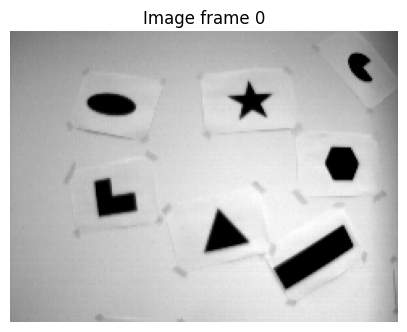

In [3]:
import matplotlib.pyplot as plt

img0 = images["frames"][0]

plt.figure(figsize=(5, 5))
plt.imshow(img0, cmap="gray")
plt.title("Image frame 0")
plt.axis("off")
plt.show()


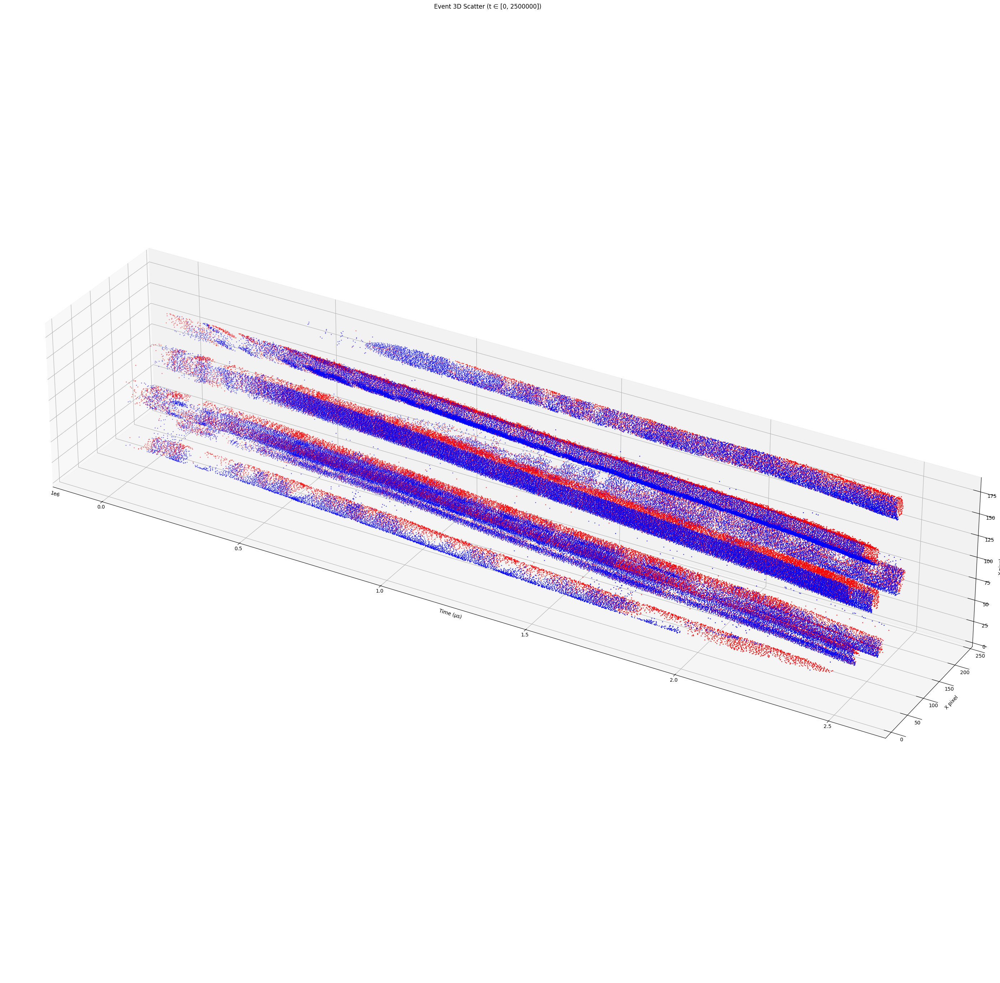

In [4]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# print(events["t"].shape)
# print(events["x"].shape)
# print(events["y"].shape)
# print(events["p"].shape)

df = pd.DataFrame({
    't': events['t'],
    'x': events['x'],
    'y': events['y'],
    'p': events['p']
})

t_min = 0
t_max = 2500000

df_filtered = df[(df['t'] >= t_min) & (df['t'] <= t_max)]

t_plot = df_filtered['t'].values
x_plot = df_filtered['x'].values
y_plot = df_filtered['y'].values
p_plot = df_filtered['p'].values

colors_plot = np.where(p_plot > 0, 'red', 'blue')

fig = plt.figure(figsize=(35, 35))
ax = fig.add_subplot(111, projection='3d')
ax.set_box_aspect((5, 1, 1))

ax.scatter(t_plot, x_plot, y_plot, c=colors_plot, s=1)

ax.set_xlabel("Time (µs)")
ax.set_ylabel("X pixel")
ax.set_zlabel("Y pixel")
ax.set_title(f"Event 3D Scatter (t ∈ [{t_min}, {t_max}])")

plt.show()

Number of images in range: 57


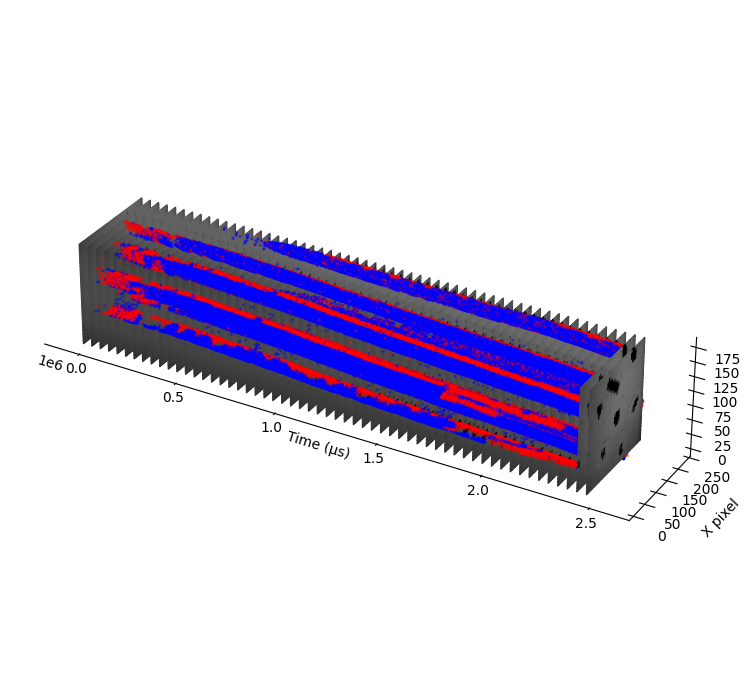

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

t_min = 0
t_max = 2500000

img_ts = images["ts"]
img_frames = images["frames"]

img_mask = (img_ts >= t_min) & (img_ts <= t_max)

img_ts_filt = img_ts[img_mask]
img_frames_filt = img_frames[img_mask]

print(f"Number of images in range: {len(img_ts_filt)}")


fig = plt.figure(figsize=(30, 8))
ax = fig.add_axes([0.03, 0.1, 0.94, 0.85], projection="3d")

# ========= 1. Event scatter =========
ax.scatter(
    t_plot,
    x_plot,
    y_plot,
    c=colors_plot,
    s=1,
    alpha=0.4
)

ds = 3  # downsample factor

for img, t_img in zip(img_frames_filt, img_ts_filt):

    img_ds = img[::ds, ::ds]
    H_ds, W_ds = img_ds.shape

    x = np.arange(W_ds) * ds
    y = np.arange(H_ds) * ds

    X, Y = np.meshgrid(x, y)
    T = np.full_like(X, t_img)

    img_norm = img_ds / 255.0

    ax.plot_surface(
        T,
        X,
        Y,
        facecolors=plt.cm.gray(img_norm),
        shade=False,
        alpha=0.9
    )


# ========= 3. Trang trí =========
ax.set_xlabel("Time (µs)")
ax.set_ylabel("X pixel")
ax.set_zlabel("Y pixel")

ax.set_box_aspect((5, 1, 1))
ax.grid(False)

for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
    axis.pane.fill = False
    axis.pane.set_edgecolor("w")

plt.show()


Let's bin our events into roughly the same time bins. The sampling frequency for images in microseconds can be calculated easily.

In [5]:
import numpy as np

mean_diff = np.diff(list(zip(images["ts"], images["ts"][1:]))).mean()
print(f"Average difference in image timestamps in microseconds: {mean_diff}")

Average difference in image timestamps in microseconds: 44065.366051660516


Say we wanted to apply the same transform to the event frames and grey-level images at the same time. Since the DAVIS dataset has a tuple of data, we have to make use of a helper function to apply our transforms specifically, as we can not apply any single transform to the data tuple at once.

In [6]:
import torch
import torchvision

sensor_size = tonic.datasets.DAVISDATA.sensor_size
frame_transform = tonic.transforms.ToFrame(
    sensor_size=sensor_size, time_window=mean_diff
)

image_center_crop = torchvision.transforms.Compose(
    [torch.tensor, torchvision.transforms.CenterCrop((100, 100))]
)


def data_transform(data):
    # first we have to unpack our data
    events, imu, images = data
    # we bin events to event frames
    frames = frame_transform(events)
    # then we can apply frame transforms to both event frames and images at the same time
    frames_cropped = image_center_crop(frames)
    images_cropped = image_center_crop(images["frames"])
    return frames_cropped, imu, images_cropped

Now we can load the same sample file again, this time with our custom transform function.

In [7]:
dataset = tonic.datasets.DAVISDATA(
    save_to="./data", recording="slider_depth", transform=data_transform
)

data, targets = dataset[0]
frames_cropped, imu, images_cropped = data

  0%|          | 0/18154269 [00:00<?, ?it/s]

In [8]:
# frames_cropped

All what's left is to plot binned event frame and image next to each other.

C:\Users\Acer\AppData\Local\Temp\ipykernel_10440\889340927.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2)


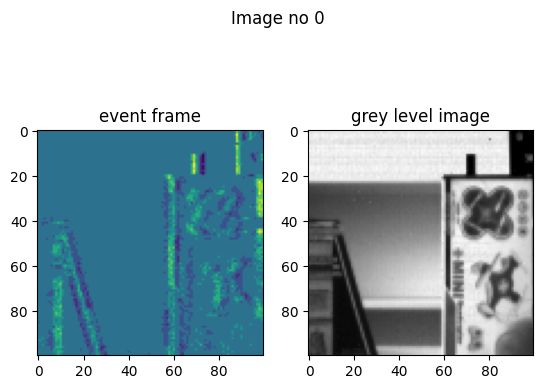

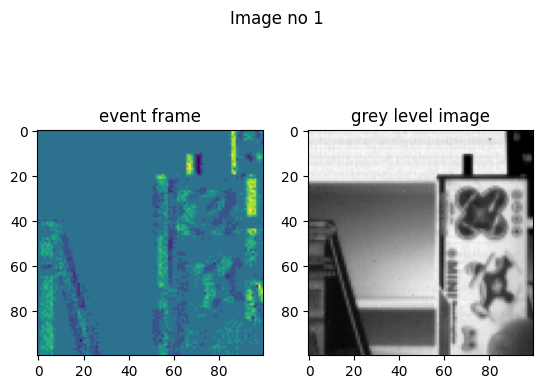

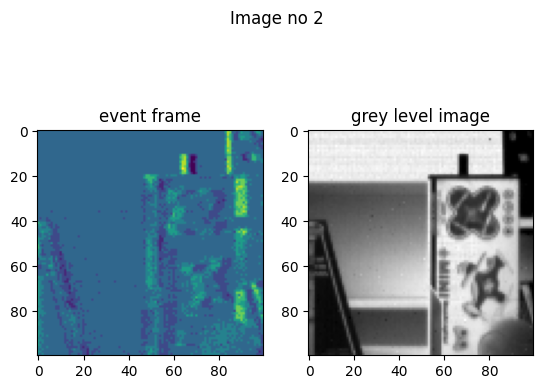

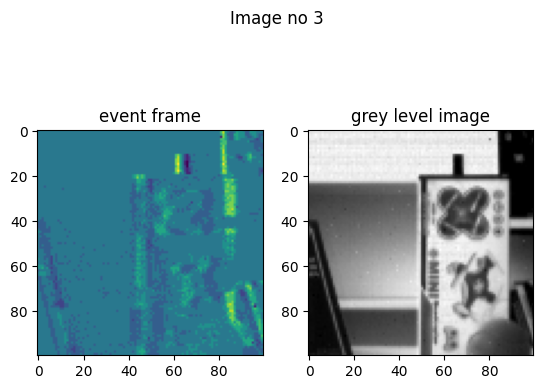

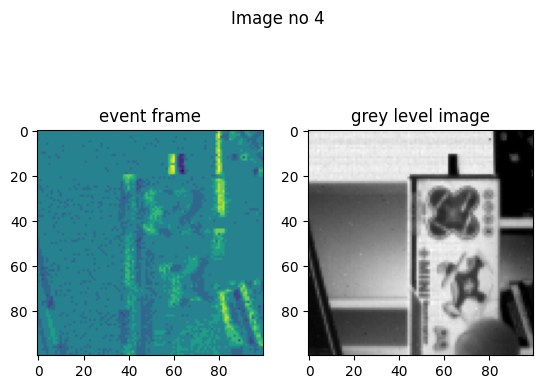

...

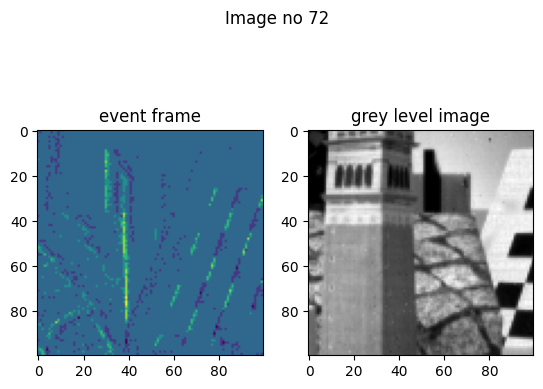

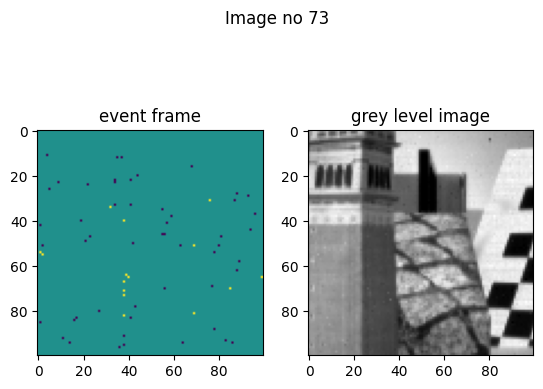

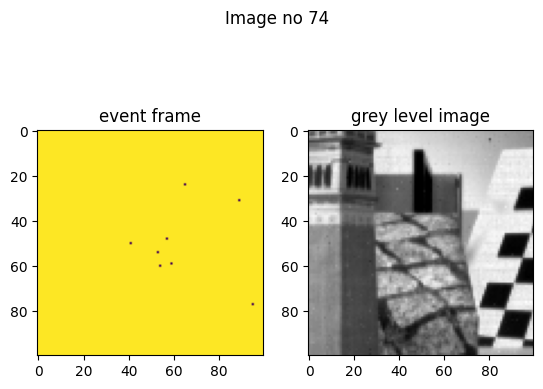

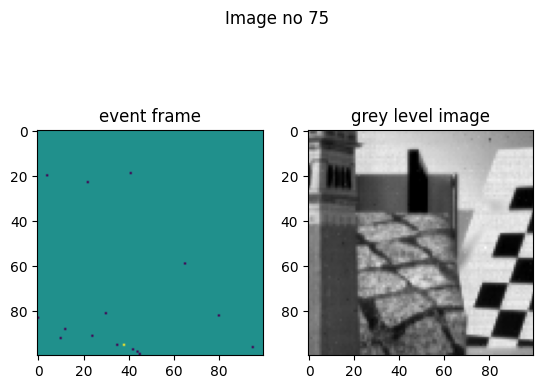

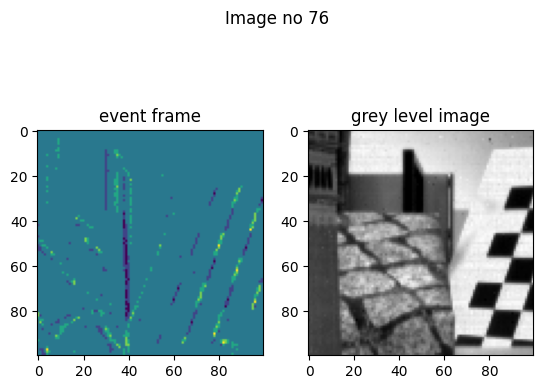

In [9]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt


nth = np.arange(0, 77)

for n in nth:

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.suptitle("Image no " + str(n))
    event_frame = frames_cropped[n]
    ax1.imshow(event_frame[0] - event_frame[1])
    ax1.set_title("event frame")
    ax2.imshow(images_cropped[n], cmap=mpl.cm.gray)
    ax2.set_title("grey level image");

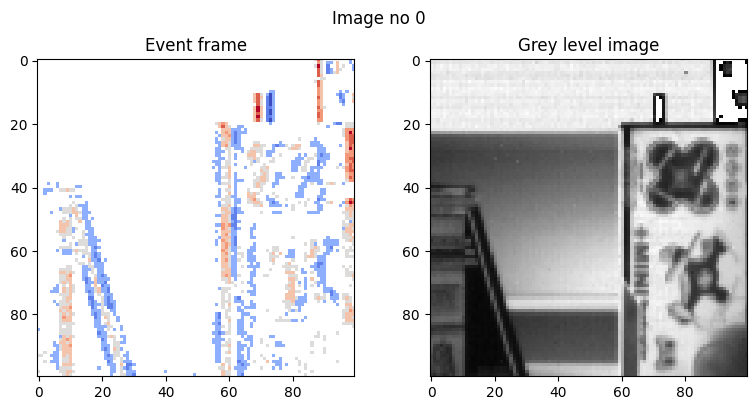

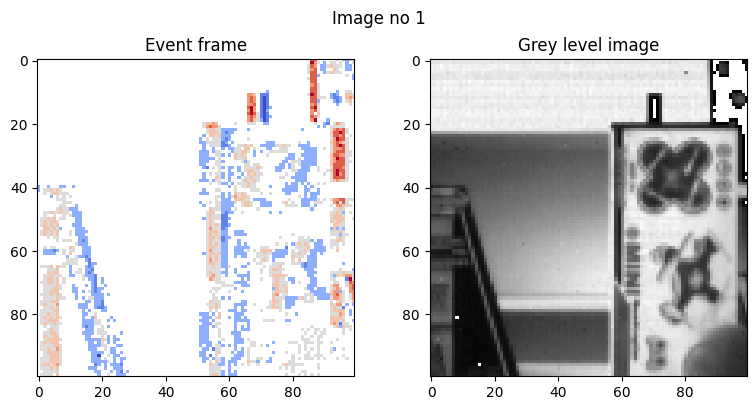

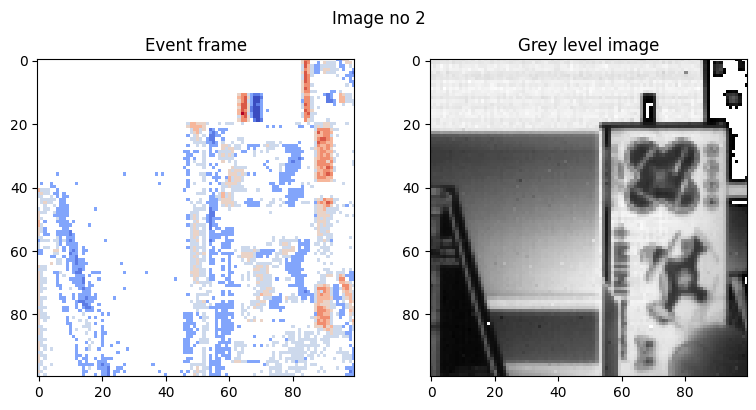

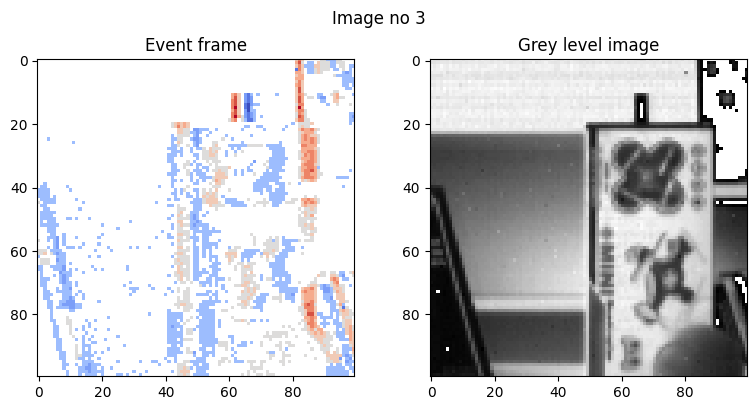

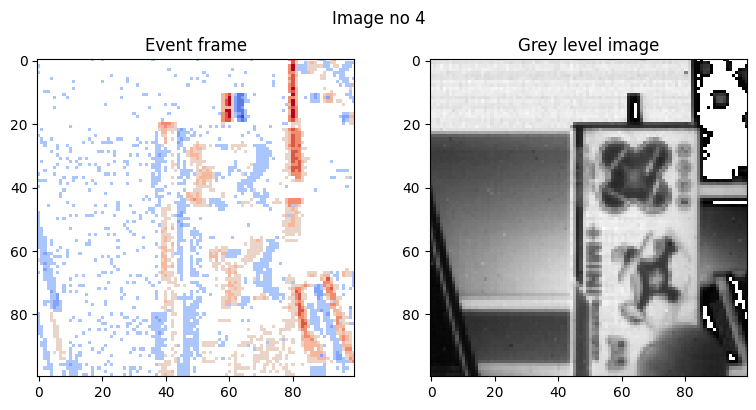

...

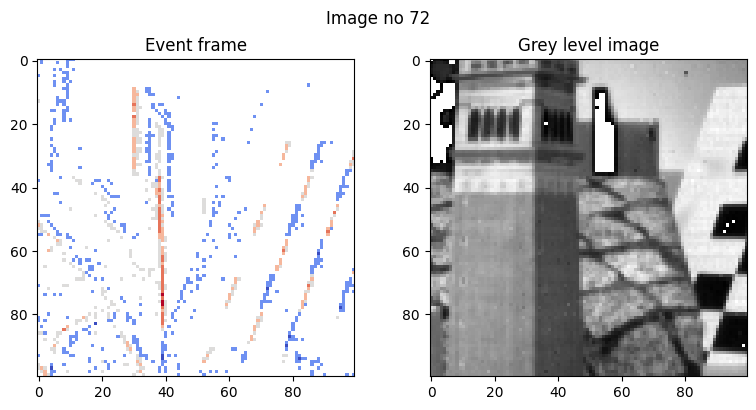

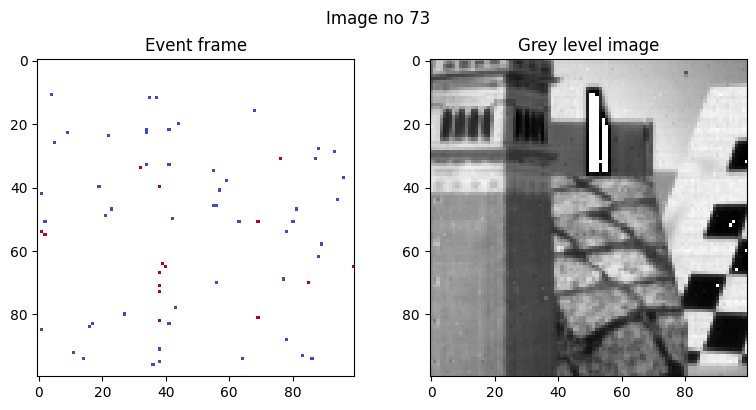

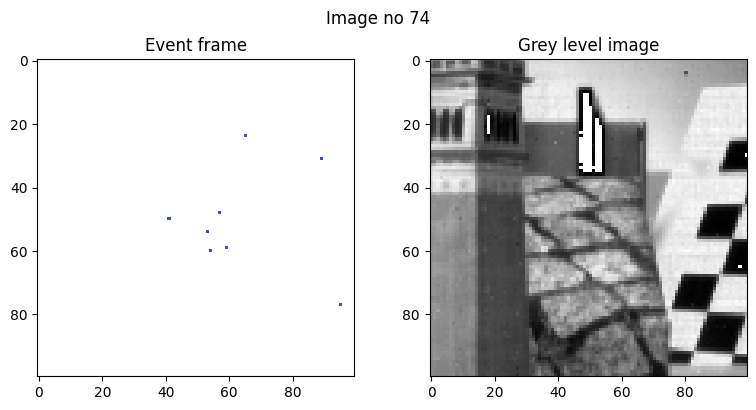

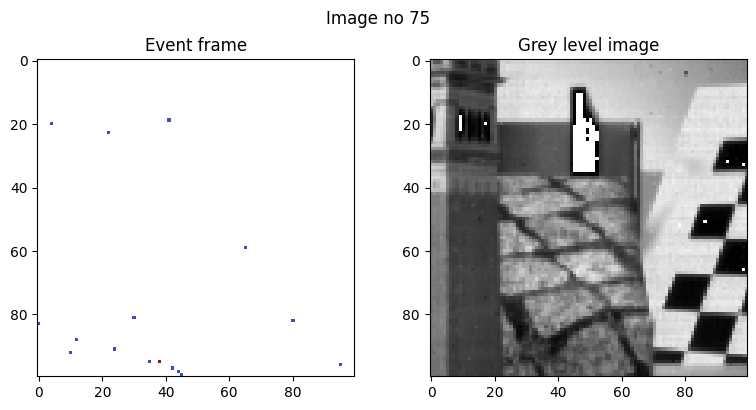

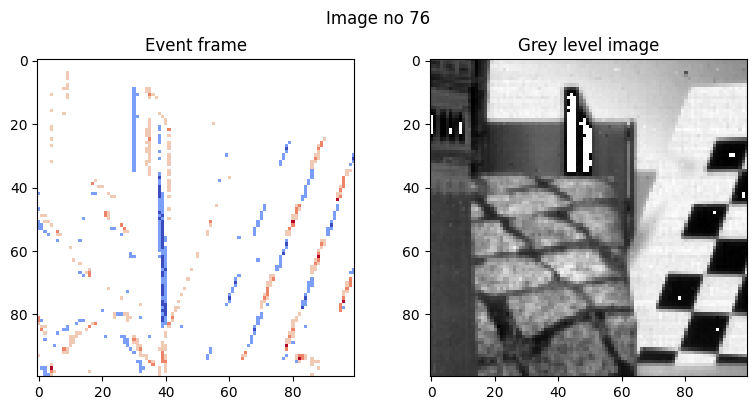

In [10]:
%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

nth = np.arange(0, 77)

for n in nth:

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    fig.suptitle(f"Image no {n}")

    # ===== Event frame =====
    event_frame = frames_cropped[n]
    event_img = event_frame[0] - event_frame[1]

    event_masked = np.ma.masked_where(event_img == 0, event_img)

    ax1.imshow(event_masked, cmap="coolwarm")
    ax1.set_title("Event frame")

    # ===== Grayscale image =====
    img = images_cropped[n]
    img_masked = np.ma.masked_where(img == 0, img)

    ax2.imshow(img_masked, cmap=mpl.cm.gray)
    ax2.set_title("Grey level image")

    plt.tight_layout()
    plt.show()
